In [ ]:
pip install geopandas contextily

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# Task 1

In [ ]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import contextily as ctx
import rasterio as rio
from rasterio import plot

In [ ]:
chicago = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/data/chicago_parcels/Chicago_parcels.shp')

# Task 2

In [ ]:
chicago.info() #finding out the data types of the attributes, finding out how many entries (592521)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 592521 entries, 0 to 592520
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype   
---  ------    --------------   -----   
 0   POLY_ID   592521 non-null  int32   
 1   ID        592521 non-null  int64   
 2   AREA      592521 non-null  float64 
 3   PIN_OLD   592521 non-null  int64   
 4   PIN       592521 non-null  int64   
 5   geometry  592521 non-null  geometry
dtypes: float64(1), geometry(1), int32(1), int64(3)
memory usage: 24.9 MB


In [ ]:
chicago.head(10) # looking at the first few rows of the dataset

,POLY_ID,ID,AREA,PIN_OLD,PIN,geometry
0,1,93,0.01,836300010,836300010,"POLYGON ((1091182.694 1942890.287, 1091173.159..."
1,2,94,0.00,836300011,836300011,"POLYGON ((1092430.298 1943191.955, 1092463.452..."
2,3,96,0.02,836300013,836300013,"POLYGON ((1092323.996 1942962.61, 1092301.306 ..."
3,4,95,0.01,836300012,836300012,"POLYGON ((1092024.119 1942447.762, 1091997.19 ..."
4,5,92,0.01,836300009,836300009,"POLYGON ((1091970.533 1942338.191, 1091929.082..."
5,6,98,0.00,836301007,836301007,"POLYGON ((1091889.266 1942159.981, 1091833.063..."
6,7,97,0.02,836301003,836301003,"POLYGON ((1091753.543 1941824.459, 1091716.52 ..."
7,8,5,0.03,836100006,836100006,"POLYGON ((1092172.233 1942219.598, 1092135.727..."
8,9,7,0.00,836101008,836101008,"POLYGON ((1092423.468 1945012.166, 1092400.259..."
9,10,17,0.01,836101028,836101028,"POLYGON ((1092434.77 1945796.435, 1092773.374 ..."


## Task 3

In [ ]:
pip install lonboard

In [ ]:

import numpy as np
import pandas as pd
import geopandas as gpd
from sklearn.cluster import KMeans, DBSCAN
import matplotlib.pyplot as plt
import shapely
import folium
from folium import plugins
import seaborn as sns
from lonboard import Map, ScatterplotLayer, SolidPolygonLayer
from lonboard import viz

In [37]:
layer = SolidPolygonLayer.from_geopandas(
    chicago,
    get_fill_color=[255,0,0],)
m = Map([layer])
#here i make a map using solid polygons to represent the tax parcels in the dataframe. I choose a bright red colour code.

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [38]:
m #this simply calls my map

Map(custom_attribution='', layers=(SolidPolygonLayer(get_fill_color=[255, 0, 0], table=arro3.core.Table
------…

## T4

*  correlation analysis


In [ ]:
chicago['centroid'] = chicago['geometry'].centroid #create centroids from polygons

In [ ]:
centroids = chicago['centroid'].apply(lambda point: [point.x, point.y]).to_list() #extract coordinates

In [ ]:
chicago['latitude'] = chicago['centroid'].apply(lambda point: point.y)
chicago['longitude'] = chicago['centroid'].apply(lambda point: point.x) #use extracted coordinates to make two new columns, latitude and longitude

In [ ]:
kmeans_adjusted = KMeans(n_clusters=8, random_state=42) #first kmeans test using default parameters
chicago['kmeans_cluster_adjusted'] = kmeans_adjusted.fit_predict(chicago[['longitude', 'latitude']])

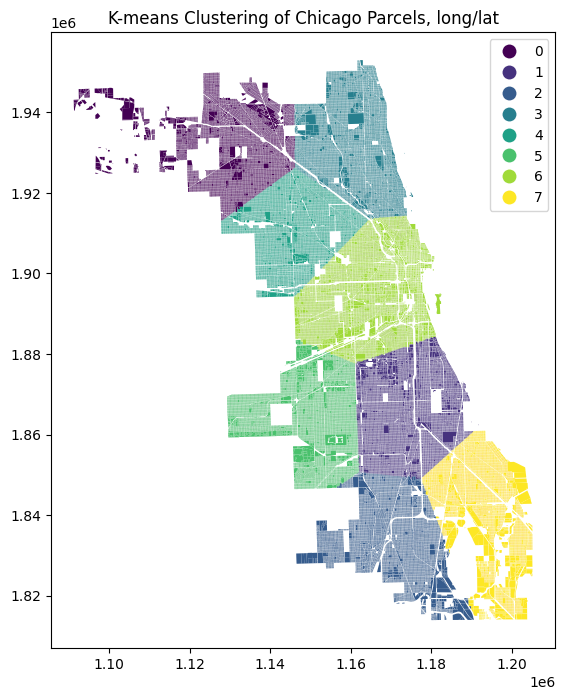

In [ ]:
chicago.plot(column='kmeans_cluster_adjusted', categorical=True, legend=True, cmap='viridis', figsize=(10, 8))
plt.title('K-means Clustering of Chicago Parcels, long/lat')
plt.show()
#this is a plot of my first kmeans cluster test. we see clear clusters but they are very large.

In [ ]:
kmeans_adjusted1 = KMeans(n_clusters=8, random_state=42)
chicago['kmeans_cluster_adjusted1'] = kmeans_adjusted1.fit_predict(chicago[['longitude', 'latitude', 'AREA']])
#running a new kmeans that inludes area to see the correlation

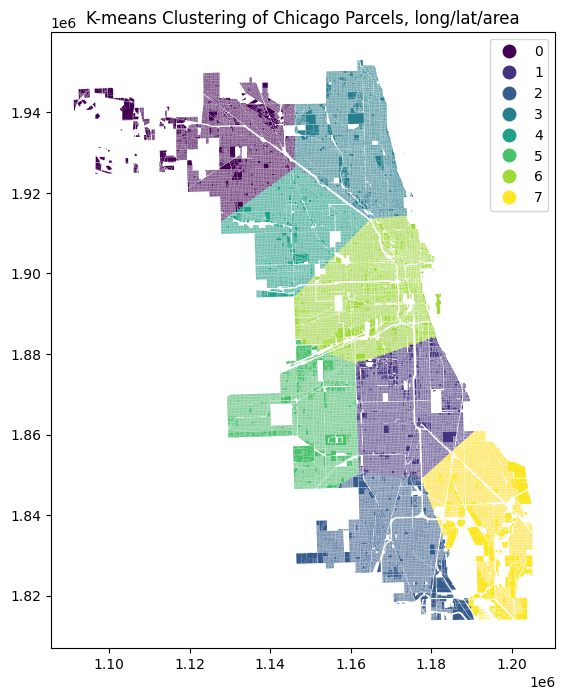

In [ ]:
chicago.plot(column='kmeans_cluster_adjusted1', categorical=True, legend=True, cmap='viridis', figsize=(10, 8))
plt.title('K-means Clustering of Chicago Parcels, long/lat/area')
plt.show()

### so, here i see that the clustering does not change based on the numerical attribute AREA. This implies no correlation. I will do a correlation text to make sure.

In [ ]:
correlation_matrix = chicago[['AREA', 'longitude', 'latitude']].corr()
print(f"Correlation between area and longitude: {correlation_matrix.loc['AREA', 'longitude']:.4f}")
print(f"Correlation between area and latitude: {correlation_matrix.loc['AREA', 'latitude']:.4f}")

Correlation between area and longitude: 0.0053
Correlation between area and latitude: -0.0103


In [ ]:
#this proves there is no significant statistical correlation between the variables




## T5 - main kmeans exercise

In [31]:
kmeans = KMeans(n_clusters=5, random_state=42)
chicago['kmeans_cluster1'] = kmeans.fit_predict(chicago[['longitude', 'latitude']])

kmeans1 = KMeans(n_clusters=10, random_state=42)
chicago['kmeans_cluster2'] = kmeans1.fit_predict(chicago[['longitude', 'latitude']])
                                                                                                        ##I tested a lot of different variables, these are just a few i kept
                                                                                                         ##(couldn't use them all for RAM reasons)
kmeans2 = KMeans(n_clusters=25, random_state=42)
chicago['kmeans_cluster3'] = kmeans2.fit_predict(chicago[['longitude', 'latitude']])

#### Map for 5 Clusters

In [27]:
from shapely import wkt
chicago['centroid'] = chicago['centroid'].apply(lambda geom: wkt.loads(geom) if isinstance(geom, str) else geom)
chicago['centroid'] = chicago['centroid'].apply(lambda geom: geom.wkt)
layer_cl5 = SolidPolygonLayer.from_geopandas(chicago)
map_cl5 = Map(layers=[layer_cl5], _height=400)
map_cl5

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


Map(custom_attribution='', layers=(SolidPolygonLayer(table=arro3.core.Table
-----------
POLY_ID: UInt32
ID: UI…

In [32]:
categories_kmeans = chicago['kmeans_cluster1'].unique()
colors_kmeans = sns.color_palette("tab10", len(categories_kmeans))
color_dict_kmeans = dict(zip(categories_kmeans, colors_kmeans))
color_array_kmeans = np.array([tuple(np.append(np.multiply(color_dict_kmeans.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in chicago['kmeans_cluster1']], dtype=np.uint8)
layer_cl5.radius_scale = 50
layer_cl5.opacity = 0.5
layer_cl5.get_fill_color = color_array_kmeans

### Map for 10 clusters

In [33]:
layer_cl10 = SolidPolygonLayer.from_geopandas(chicago)
map_cl10 = Map(layers=[layer_cl10], _height=400)
map_cl10

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


Map(custom_attribution='', layers=(SolidPolygonLayer(table=arro3.core.Table
-----------
POLY_ID: UInt32
ID: UI…

In [34]:
categories_kmeans1 = chicago['kmeans_cluster2'].unique()
colors_kmeans1 = sns.color_palette("tab20c", len(categories_kmeans1))
color_dict_kmeans1 = dict(zip(categories_kmeans1, colors_kmeans1))
color_array_kmeans1 = np.array([tuple(np.append(np.multiply(color_dict_kmeans1.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in chicago['kmeans_cluster2']], dtype=np.uint8)
layer_cl10.radius_scale = 50
layer_cl10.opacity = 0.5
layer_cl10.get_fill_color = color_array_kmeans1

### Map for 25 Clusters

In [35]:
layer_cl25 = SolidPolygonLayer.from_geopandas(chicago)
map_cl25 = Map(layers=[layer_cl25], _height=400)
map_cl25

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


Map(custom_attribution='', layers=(SolidPolygonLayer(table=arro3.core.Table
-----------
POLY_ID: UInt32
ID: UI…

In [36]:
categories_kmeans2 = chicago['kmeans_cluster3'].unique()
colors_kmeans2 = sns.color_palette("tab20c", len(categories_kmeans2))
color_dict_kmeans2 = dict(zip(categories_kmeans2, colors_kmeans2))
color_array_kmeans2 = np.array([tuple(np.append(np.multiply(color_dict_kmeans2.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in chicago['kmeans_cluster3']], dtype=np.uint8)
layer_cl25.radius_scale = 50
layer_cl25.opacity = 0.5
layer_cl25.get_fill_color = color_array_kmeans2

#### here I can see that the colour differentiation is limited beyond 9 clusters.  after that, it is diffcult to discern meaningful categorisation. 5 clusters seems too simple, it is hard to identify any patterns. to me 10 appears to be the optimal n_cluster parameter of my tested clusters.

## T6 - DBSCAN

In [ ]:
dbscan = DBSCAN(eps = 850, min_samples=5)
chicago['dbscan_cluster'] = dbscan.fit_predict(chicago[['longitude', 'latitude']])
dbscan810 = DBSCAN(eps = 850, min_samples=10)
chicago['dbscan_cluster810'] = dbscan810.fit_predict(chicago[['longitude', 'latitude']]) #lots of variable testing was done. it took a very long time to load all the visualisations into plots to test them.
##                                         eventually i picked some variables that shows good changes that i could analyse.
dbscan815 = DBSCAN(eps = 850, min_samples=15)
chicago['dbscan_cluster815'] = dbscan815.fit_predict(chicago[['longitude', 'latitude']])

In [ ]:
dbscan2 = DBSCAN(eps= 150, min_samples=5)
chicago['dbscan_cluster2'] = dbscan2.fit_predict(chicago[['longitude', 'latitude']])
dbscan4 = DBSCAN(eps= 150, min_samples=10)
chicago['dbscan_cluster4'] = dbscan4.fit_predict(chicago[['longitude', 'latitude']])
dbscan5 = DBSCAN(eps= 150, min_samples=15)
chicago['dbscan_cluster5'] = dbscan5.fit_predict(chicago[['longitude', 'latitude']])

In [ ]:
dbscan3 = DBSCAN(eps=75, min_samples=5)
chicago['dbscan_cluster3'] = dbscan3.fit_predict(chicago[['longitude', 'latitude']])
dbscan7510 = DBSCAN(eps = 75, min_samples=10)
chicago['dbscan_cluster7510'] = dbscan.fit_predict(chicago[['longitude', 'latitude']])
dbscan7515 = DBSCAN(eps = 75, min_samples=15)
chicago['dbscan_cluster7515'] = dbscan.fit_predict(chicago[['longitude', 'latitude']])

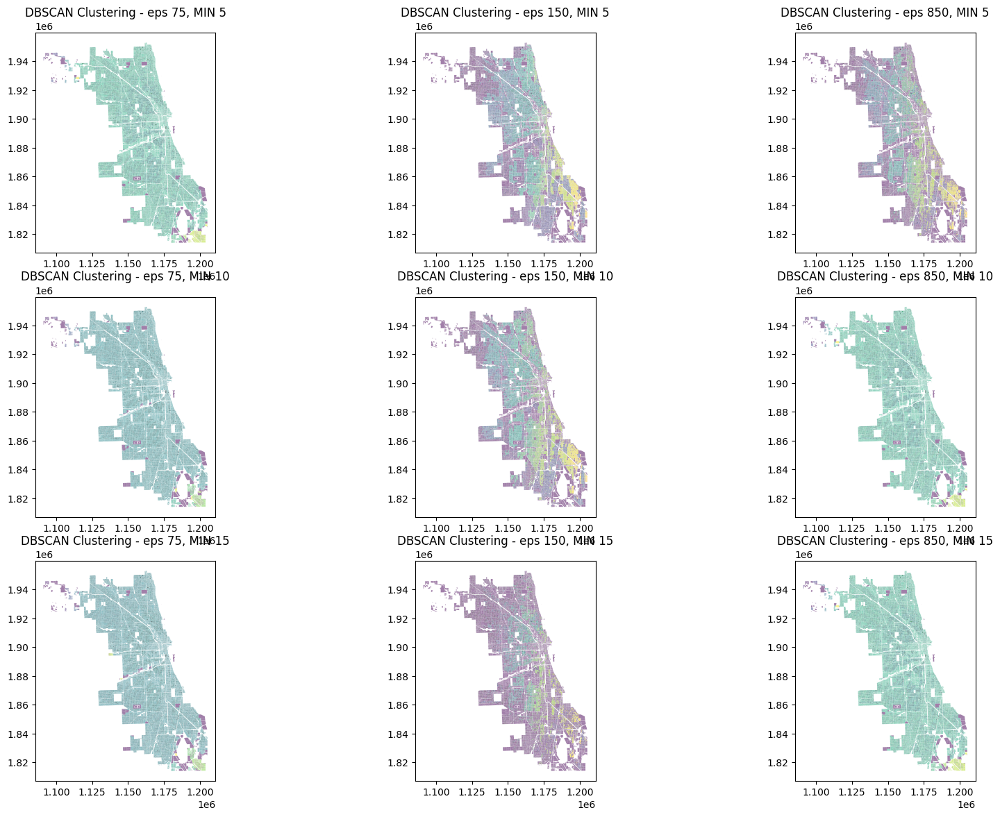

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(20, 14))
chicago.plot(ax=axes[0,0], column='dbscan_cluster', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[1, 0], column='dbscan_cluster810', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[2,0], column='dbscan_cluster815', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[0,1], column='dbscan_cluster2', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[1,1], column='dbscan_cluster4', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[2,1], column='dbscan_cluster5', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[0,2], column='dbscan_cluster3', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[1,2], column='dbscan_cluster7510', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
chicago.plot(ax=axes[2,2], column='dbscan_cluster7515', categorical=True, legend=False, markersize=1, alpha=0.5, cmap='viridis')
axes[0,0].set_title('DBSCAN Clustering - eps 75, MIN 5')
axes[1,0].set_title('DBSCAN Clustering - eps 75, MIN 10')
axes[2,0].set_title('DBSCAN Clustering - eps 75, MIN 15')
axes[0,1].set_title('DBSCAN Clustering - eps 150, MIN 5')
axes[1,1].set_title('DBSCAN Clustering - eps 150, MIN 10')
axes[2,1].set_title('DBSCAN Clustering - eps 150, MIN 15')
axes[0,2].set_title('DBSCAN Clustering - eps 850, MIN 5')
axes[1,2].set_title('DBSCAN Clustering - eps 850, MIN 10')
axes[2,2].set_title('DBSCAN Clustering - eps 850, MIN 15')
##plotting my final figure
plt.show()

## T10

#### From my final figure, I can firstly see that 850 eps leaves a lot of points as noise (i.e grey). There is some good cluster concentration but i think this higher eps may end up with us overlooking some smaller clusters.

eps 75 seems to create minimal differentiation despite less noise. 75 MIN 5 seems to have the least noise out of these.

this trend continues, i.e min_samples (5) seems to reduce noise and spread out the clusters, whereas the higher min samples create more noise.

From these observations I would conclude that EPS 150 with min_samples of 5 is the most optimal of the results I produced. We see clear clustering from which we can observe patters, with not too much noise.

Based on this conclusion we can apply this to a real-world setting. For example, we could consider what these clusers represent. Clusters may represent areas of Chicago that are a similar age, so they share similar levels of building density, or they could represent different enighbourhoods or districts. They may also differentiate areas into industrial etc. These density considerations could be important when considering the implementation of new infrastructure, who may be displaced, where it would most beneft people and also minimise disruptionn.